<a href="https://colab.research.google.com/github/mohammadreza-sheykhmousa/Geo-tools/blob/main/SSA_GEO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pwd

'/content'

# SAM-geo

In [ ]:
!git clone https://github.com/mohammadreza-sheykhmousa/segment-geospatial.git

Cloning into 'segment-geospatial'...
remote: Enumerating objects: 323, done.
remote: Counting objects: 100% (135/135), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 323 (delta 100), reused 93 (delta 77), pack-reused 188
Receiving objects: 100% (323/323), 76.08 KiB | 2.30 MiB/s, done.
Resolving deltas: 100% (181/181), done.


In [ ]:
import os
os.chdir('/content/segment-geospatial')
!pwd

/content/segment-geospatial


In [ ]:
%pip install segment-geospatial leafmap localtileserver

In [ ]:
# !pip install leafmap
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install pyproj
!pip install rasterio
!pip install geopandas
!pip install localtileserver

In [ ]:
import os
import leafmap
import torch
from osgeo import gdal
from samgeo import SamGeo, tms_to_geotiff, SamGeoPredictor, tms_to_geotiff, get_basemaps
from segment_anything import sam_model_registry

In [ ]:
m = leafmap.Map(center=[36.676840, 45.369222], zoom=10)
m.add_basemap('SATELLITE')
# m

In [ ]:
if m.user_roi_bounds() is not None:
    clip_box = m.user_roi_bounds()
else:
    clip_box = [-123.0064, 44.9988, -123.0005, 45.0025]

# check the dataset


In [ ]:
from osgeo import gdal


image = "/content/drive/MyDrive/2019/4latest_202108.tif"

# Open the GeoTIFF file for reading
dataset = gdal.Open(image, gdal.GA_ReadOnly)

# Get the number of bands in the dataset
num_bands = dataset.RasterCount

# Get the size of the dataset in pixels and lines
cols = dataset.RasterXSize
rows = dataset.RasterYSize

# Get the data type of the pixel values
data_type = gdal.GetDataTypeName(dataset.GetRasterBand(1).DataType)

# Print the information
print(f"Number of bands: {num_bands}")
print(f"Size: {cols}x{rows}")
print(f"Data type: {data_type}")


Number of bands: 4
Size: 4400x4757
Data type: UInt16


# change the dataype

In [ ]:
import os
from osgeo import gdal

output_file = os.path.splitext(os.path.basename(image))[0] + '.tif'

# Open the input file
input_ds = gdal.Open(image)

# Create the output file
driver = gdal.GetDriverByName('GTiff')
output_ds = driver.Create(output_file, input_ds.RasterXSize, input_ds.RasterYSize, input_ds.RasterCount, gdal.GDT_Byte)

# Set the geotransform and projection of the output file to match the input file
output_ds.SetGeoTransform(input_ds.GetGeoTransform())
output_ds.SetProjection(input_ds.GetProjection())

# Loop over each band of the input file, and copy it to the output file with the desired data type
for i in range(1, input_ds.RasterCount+1):
    band = input_ds.GetRasterBand(i)
    data = band.ReadAsArray().astype('uint8')
    output_ds.GetRasterBand(i).WriteArray(data)

# Close the input and output files
input_ds = None
output_ds = None


**chnage the input to new dtype**

In [ ]:
image = "/content/segment-geospatial/4latest_202108.tif"

In [ ]:
m.add_raster(image, layer_name='Image')
m

Map(bottom=1504902.0, center=[45.253984332053435, -0.6996917724609376], controls=(ZoomControl(options=['positi…

In [ ]:
out_dir = os.path.join(os.path.expanduser("~"), "Downloads")
checkpoint = os.path.join(out_dir, "sam_vit_h_4b8939.pth")


In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    automatic=False,
    sam_kwargs=None,
)

Checkpoint /root/Downloads/sam_vit_h_4b8939.pth does not exist.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/Downloads/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:14<00:00, 179MB/s]


In [ ]:
sam.set_image(image)

In [ ]:
m = sam.show_map()
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
import cv2

img_arr = cv2.imread(image)

model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=checkpoint)

predictor = SamGeoPredictor(sam)

predictor.set_image(img_arr)

masks, _, _ = predictor.predict(src_fp=image, geo_box=clip_box)

a new tif file is saved in the root directory change the mask_img to that

<Axes: >

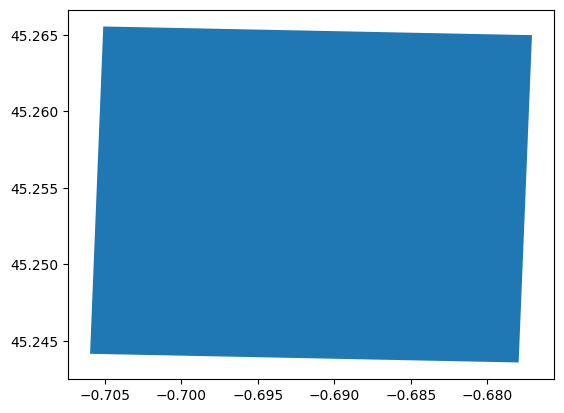

In [ ]:
vector = "4latest202108.geojson"
masks_img = "/content/segment-geospatial/masks_kfnnmm.tif"
gdf = predictor.geotiff_to_geojson(masks_img, vector, bidx=1)
gdf.plot()

In [ ]:
masks_img = "preds.tif"
predictor.masks_to_geotiff(image, masks_img, masks.astype("uint8"))